In [ ]:
import scanpy as sc
import STCOGAT
import warnings
from STCOGAT.Utils import *
from STCOGAT.data_preprocess import *
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')
sc.set_figure_params(dpi=300,fontsize=10,dpi_save=300,facecolor='white',format='pdf')
sc.settings.figdir = './Result/BRCA1/'
outdir = "./Result/Fig8_final/"
plt.rcParams.update({'axes.titlesize': 20})

cuda:0


In [3]:
STCOGAT.main.INTER_DIM = 474 
STCOGAT.main.EMBEDDING_DIM = 30 
STCOGAT.main.NUM_LAYERS = 1
STCOGAT.main.DE_GENES_NUM = 3000
STCOGAT.main.pre_emb_dim = 16
STCOGAT.main.lambda_smooth = 0.05
STCOGAT.main.lambda_contra = 0.10491208729417224
STCOGAT.main.use_rows_encoder = True

In [4]:
name = 'V1_Human_Breast_Cancer_Block_A_Section_1'
obj = sc.read_visium('data/BRCA1/' + name, count_file='filtered_feature_bc_matrix.h5')
obj.var_names_make_unique()
df_meta = pd.read_csv('data/BRCA1/' + name + '/metadata.tsv', sep='\t')
obj.obs['ground_truth'] = df_meta['fine_annot_type'].values
print(obj.obs['ground_truth'].unique())

print(obj.X.max(),obj.X.min())
sc.pp.filter_genes(obj, min_cells=3)
ad, raw = svg(obj, svg_method='seurat_v3', n_top=3000)

['Tumor_edge_5' 'IDC_4' 'Healthy_1' 'IDC_3' 'IDC_2' 'Tumor_edge_3' 'IDC_8'
 'Tumor_edge_2' 'DCIS/LCIS_5' 'IDC_6' 'Tumor_edge_6' 'Healthy_2' 'IDC_5'
 'DCIS/LCIS_4' 'IDC_7' 'Tumor_edge_1' 'DCIS/LCIS_1' 'DCIS/LCIS_2'
 'Tumor_edge_4' 'IDC_1']
6108.0 0.0


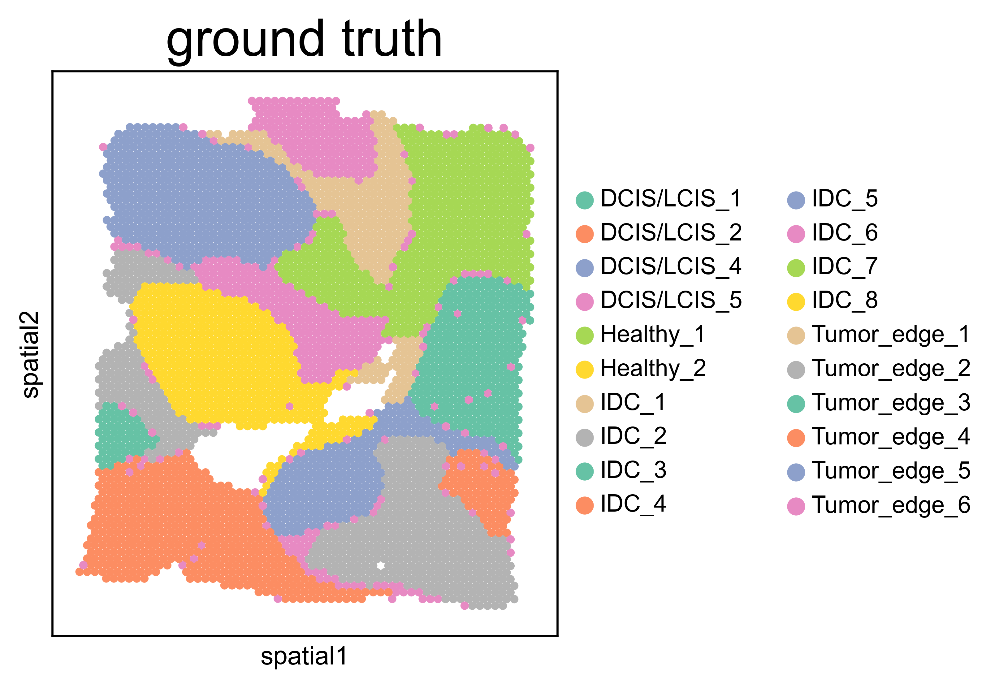

In [10]:
import seaborn as sns
plt.rcParams.update({'axes.titlesize': 20})
cats = obj.obs['ground_truth'].astype('category').cat.categories
rgb_values = sns.color_palette("Set2", len(cats))
color_fine = dict(zip(cats, rgb_values))
sc.pl.spatial(obj, color=['ground_truth'], title=['ground truth'], spot_size=300,img_key=None,ncols=1,save='truth.pdf',palette=color_fine)

In [ ]:
adata = ad.copy()
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=15)  
net, genet, node_feature = STCOGAT.build_coexpres_network(adata, topk=30)
print('genet:',genet,'node_feature:',node_feature.shape)

knn_edge_index = STCOGAT.build_fused_graph(adata,alpha=0.5,k_spat=8,knn_method='KNN')
print('Initial knn_edge_index:', knn_edge_index.shape)

STCOGAT.run_STCOGAT(adata, genet,node_feature,knn_edge_index, number_of_batches=1,max_epoch=300, model_name ="BRCA1_gene",save_model_flag=True)

In [5]:
embedded_genes, embedded_cells, node_features , out_features = STCOGAT.load_embeddings("BRCA1_gene")
embedded_genes.shape,embedded_cells.shape,node_features.shape,out_features.shape

((3000, 30), (3798, 46), (3000, 3798), (3798, 3000))

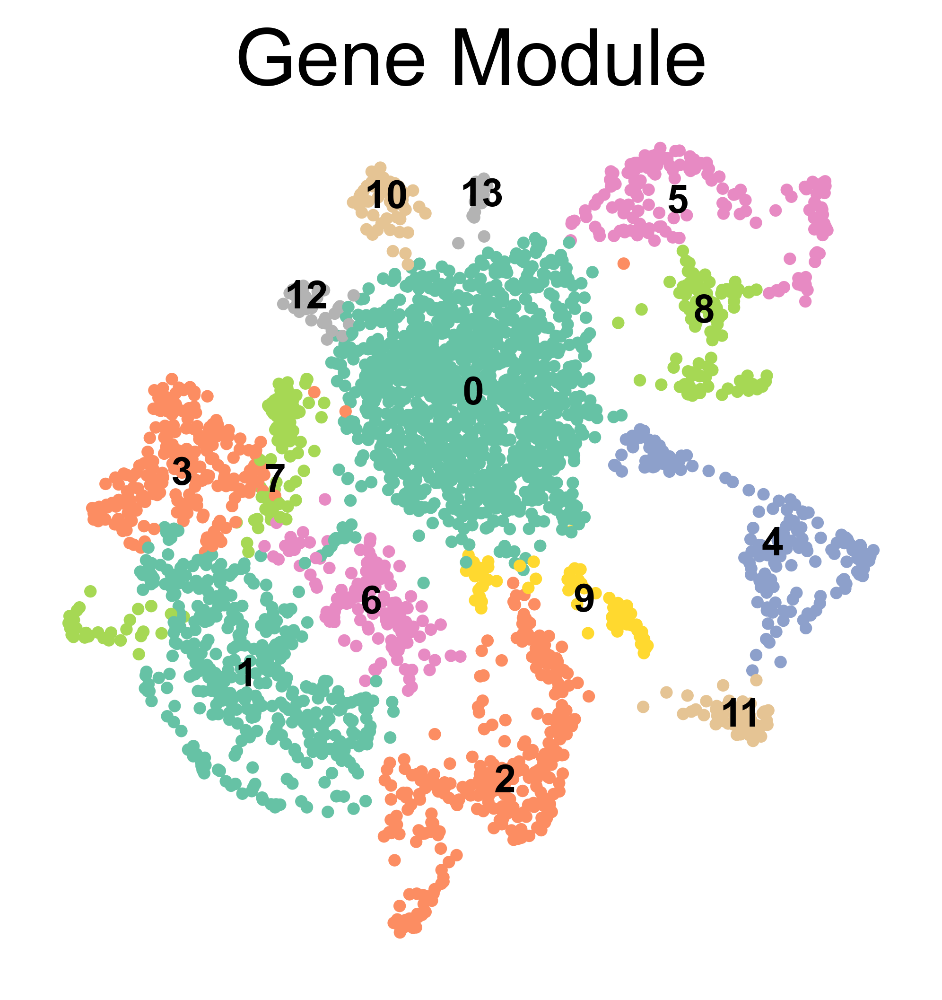

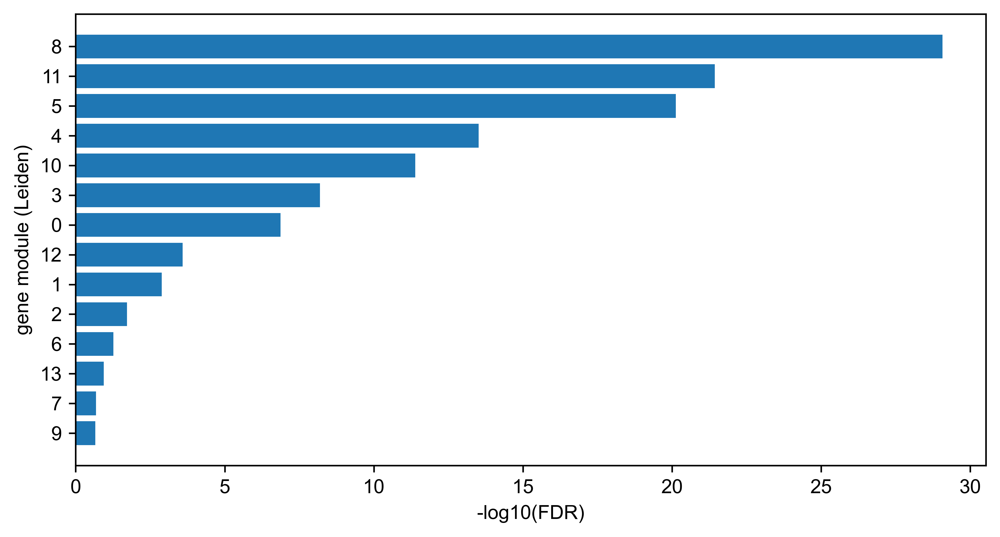

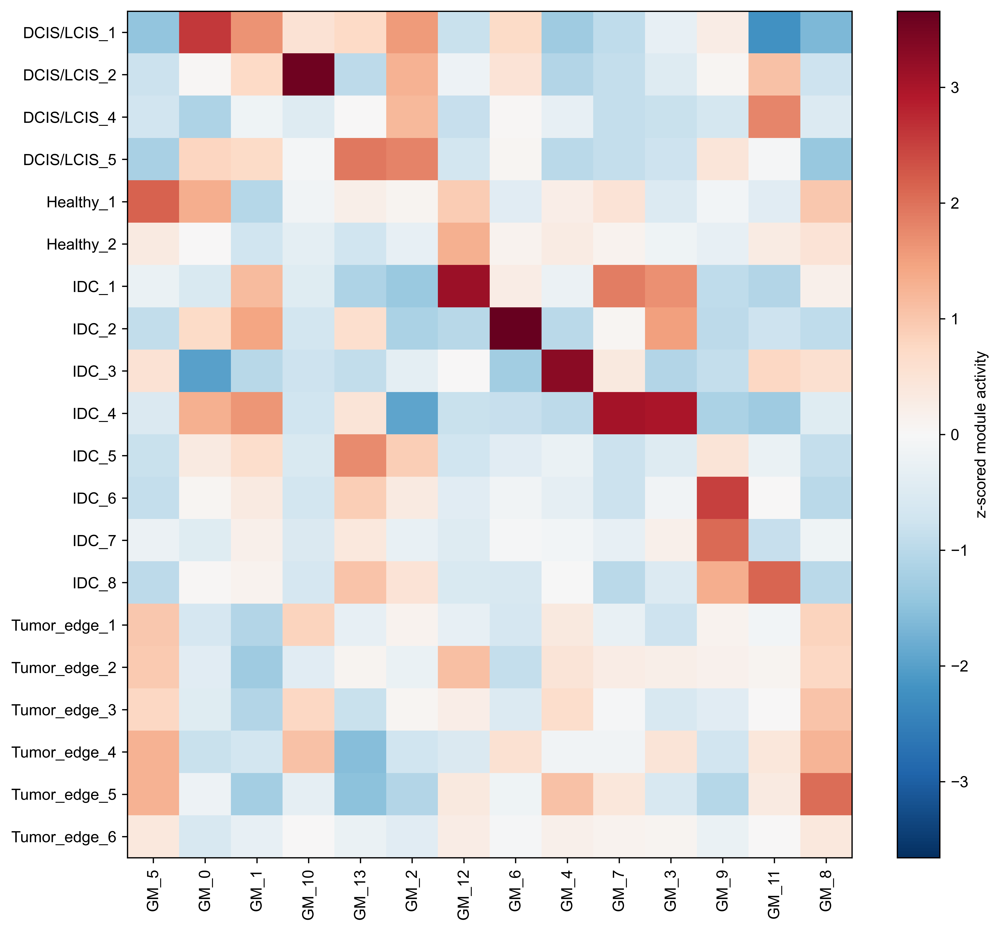

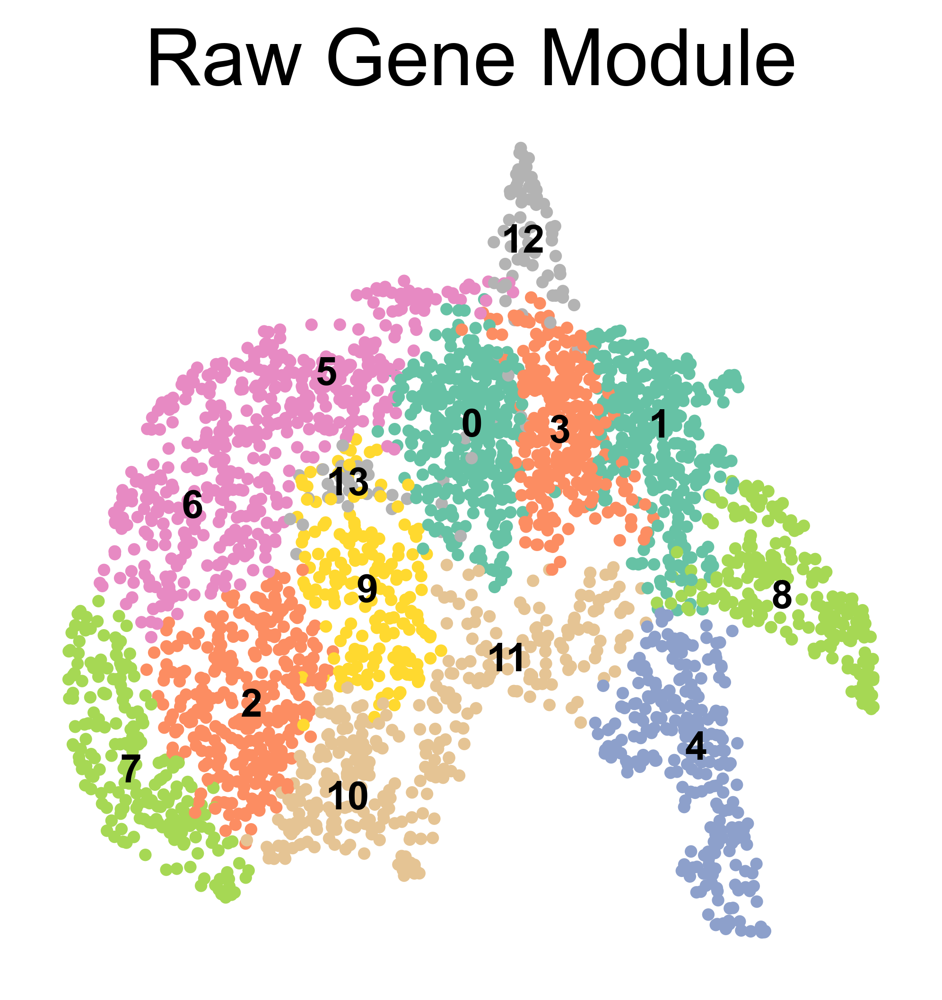

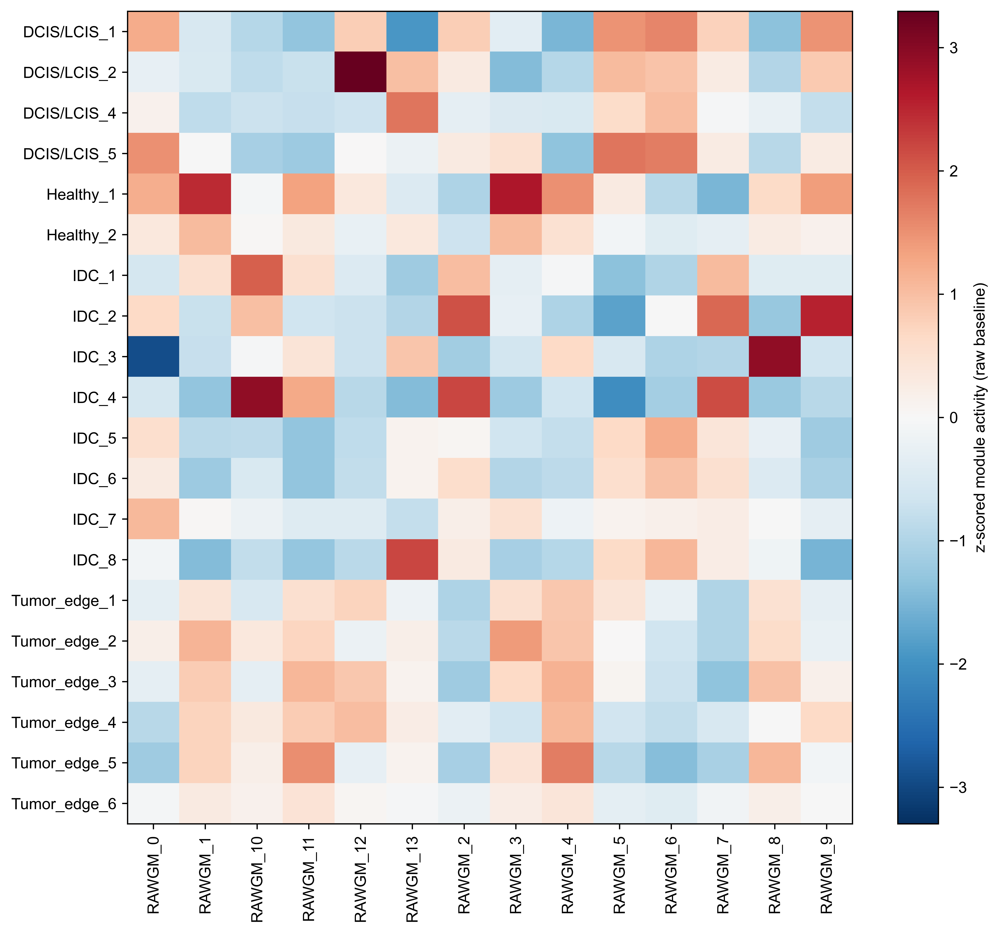

[DONE] Fig8 outputs saved to: ./Result/Fig8_repro_slice2/
  Fig8A: ./Result/Fig8_repro_slice2/Fig8A_gene_embedding_modules.pdf
  Fig8B: ./Result/Fig8_repro_slice2/Fig8B_enrichment_barplot.pdf
  Fig8C(STCOGAT): ./Result/Fig8_repro_slice2/Fig8C_module_activity_heatmap_STCOGAT.pdf
  Fig8C(RAW): ./Result/Fig8_repro_slice2/Fig8C_module_activity_heatmap_RAW.pdf


In [ ]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse as ss
import matplotlib.pyplot as plt
import gseapy as gp


def _ensure_dense(X):
    return X.toarray() if ss.issparse(X) else np.asarray(X)

def make_gene_adata_from_embedding(embedded_genes: np.ndarray, gene_names: np.ndarray):

    gadata = sc.AnnData(X=embedded_genes.astype(np.float32))
    gadata.obs_names = gene_names.astype(str)
    gadata.obs["gene"] = gadata.obs_names
    return gadata

def leiden_gene_modules(gadata, n_neighbors=15, resolution=0.8, key_added="gene_module"):

    sc.pp.neighbors(gadata, n_neighbors=n_neighbors, use_rep="X")
    sc.tl.umap(gadata)
    sc.tl.leiden(gadata, resolution=resolution, key_added=key_added)
    return gadata

def compute_module_scores_on_spots(adata, modules: dict, score_prefix="GM"):

    for mid, genes in modules.items():
        genes = [g for g in genes if g in adata.var_names]
        if len(genes) < 5:
            continue
        sc.tl.score_genes(
            adata,
            gene_list=genes,
            score_name=f"{score_prefix}_{mid}",
            use_raw=False
        )
    return adata

def summarize_scores_by_ground_truth(adata, score_cols, gt_key="ground_truth"):
    """
    Return a matrix: (ground_truth categories) x (modules) of mean scores.
    """
    df = adata.obs[[gt_key] + score_cols].copy()
    df[gt_key] = df[gt_key].astype(str)
    mat = df.groupby(gt_key)[score_cols].mean()
    mat_z = (mat - mat.mean(axis=0)) / (mat.std(axis=0) + 1e-12)
    return mat, mat_z

def make_raw_expression_gene_representation(adata, n_pcs=30, layer=None):
    X = adata.layers[layer] if layer is not None else adata.X
    X = _ensure_dense(X).astype(np.float64, copy=False)   # (spots, genes)

    Xg = X.copy()
    Xg -= Xg.mean(axis=0, keepdims=True)
    Xg /= (Xg.std(axis=0, ddof=1, keepdims=True) + 1e-12)

    from sklearn.decomposition import TruncatedSVD
    svd = TruncatedSVD(n_components=n_pcs, random_state=0)
    Z = svd.fit_transform(Xg)  # (spots, n_pcs)

    G_repr = (Xg.T @ Z) / Xg.shape[0]
    return G_repr.astype(np.float32)

def enrich_modules_gseapy(modules: dict, organism="Human",
                          gene_sets=("GO_Biological_Process_2021", "KEGG_2021_Human"),
                          outdir="./Fig8_out/enrich", top_terms=5):
    os.makedirs(outdir, exist_ok=True)
    rows = []
    for mid, glist in modules.items():
        glist = list(dict.fromkeys([g for g in glist if isinstance(g, str)]))
        if len(glist) < 10:
            continue

        for gs in gene_sets:
            try:
                enr = gp.enrichr(
                    gene_list=glist,
                    gene_sets=gs,
                    organism=organism,
                    outdir=None,   # do not write huge folders
                    cutoff=0.5
                )
                res = enr.results
                if res is None or res.shape[0] == 0:
                    continue
                res = res.sort_values("Adjusted P-value").head(top_terms)
                for _, r in res.iterrows():
                    adjp = float(r["Adjusted P-value"])
                    rows.append({
                        "module": str(mid),
                        "gene_set": gs,
                        "term": str(r["Term"]),
                        "adj_p": adjp,
                        "neglog10_fdr": -np.log10(adjp + 1e-300),
                        "overlap": str(r.get("Overlap", "")),
                        "genes_in_term": str(r.get("Genes", ""))[:200]  # truncate for safety
                    })
            except Exception as e:
                print(f"[WARN] enrichr failed for module={mid}, gene_set={gs}: {e}")

    df_enr = pd.DataFrame(rows)
    if df_enr.shape[0] > 0:
        df_enr.to_csv(os.path.join(outdir, "Fig8B_module_enrichment.csv"), index=False)
    return df_enr


def select_top_genes_by_center(embedded_genes, gadata, top_n=40, module_key="gene_module"):
    X = gadata.X  # gene embedding (G,d)
    modules_top = {}

    for mid in sorted(gadata.obs[module_key].unique()):
        idx = np.where(gadata.obs[module_key].values == mid)[0]
        X_m = X[idx]
        center = X_m.mean(axis=0, keepdims=True)
        dist = ((X_m - center) ** 2).sum(axis=1)  # squared euclidean

        order = np.argsort(dist)
        keep = idx[order[:min(top_n, len(order))]]

        modules_top[str(mid)] = gadata.obs_names[keep].tolist()
    return modules_top

def make_Fig8_gene_validation(
    adata,
    model_name,
    outdir="./Fig8_out",
    gt_key="ground_truth",
    module_resolution=0.8,
    module_k=15,
    raw_baseline_pcs=30,
):
    """
    Requires: STCOGAT.load_embeddings(model_name) -> embedded_genes (G x d)
    adata.var_names should match the gene set used to train (G genes).
    """
    os.makedirs(outdir, exist_ok=True)

    embedded_genes, embedded_cells, node_features, out_features = STCOGAT.load_embeddings(model_name)
    gene_names = np.array(adata.var_names)

    assert embedded_genes.shape[0] == len(gene_names), \
        f"Mismatch: embedded_genes has {embedded_genes.shape[0]} genes, but adata has {len(gene_names)} var_names."

    gadata = make_gene_adata_from_embedding(embedded_genes, gene_names)
    gadata = leiden_gene_modules(gadata, n_neighbors=module_k, resolution=module_resolution, key_added="gene_module")

    fig8a_path = os.path.join(outdir, "Fig8A_gene_embedding_modules.pdf")
    sc.pl.umap(
        gadata,
        color="gene_module",
        legend_loc="on data",
        frameon=False,
        palette="Set2",
        title="Gene Module",
        show=False
    )
    plt.savefig(fig8a_path, bbox_inches="tight")
    plt.show()
    plt.close()

    modules = {}
    for mid in sorted(gadata.obs["gene_module"].unique()):
        genes_in = gadata.obs_names[gadata.obs["gene_module"] == mid].tolist()
        modules[str(mid)] = genes_in

    df_enr = enrich_modules_gseapy(
        modules,
        organism="Human",
        gene_sets=("GO_Biological_Process_2021", "KEGG_2021_Human"),
        outdir=os.path.join(outdir, "enrich"),
        top_terms=5
    )

    fig8b_path = os.path.join(outdir, "Fig8B_enrichment_barplot.pdf")
    if df_enr.shape[0] > 0:
        df_bp = df_enr[df_enr["gene_set"] == "GO_Biological_Process_2021"].copy()
        if df_bp.shape[0] == 0:
            df_bp = df_enr.copy()

        df_top = (
            df_bp.sort_values(["module", "adj_p"])
                 .groupby("module", as_index=False)
                 .head(1)
        )
        df_top = df_top.sort_values("neglog10_fdr", ascending=False)

        plt.figure(figsize=(7.2, max(3.0, 0.28 * len(df_top))))
        plt.barh(df_top["module"].astype(str), df_top["neglog10_fdr"].values)
        plt.xlabel(r"-log10(FDR)")
        plt.ylabel("gene module (Leiden)")
        plt.grid(False)
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.savefig(fig8b_path, bbox_inches="tight")
        plt.show()
        plt.close()

        df_top.to_csv(os.path.join(outdir, "Fig8B_top_term_per_module.csv"), index=False)

    adata_sc = adata.copy()
    modules_top40 = select_top_genes_by_center(embedded_genes, gadata, top_n=40)
    adata_sc = compute_module_scores_on_spots(adata_sc, modules_top40, score_prefix="GM")

    score_cols = [c for c in adata_sc.obs.columns if c.startswith("GM_")]
    mat_mean, mat_z = summarize_scores_by_ground_truth(adata_sc, score_cols, gt_key=gt_key)



    dominant_cell = mat_z.idxmax(axis=0)
    cell_order = [
    "Healthy_1", "Healthy_2",
    "DCIS/LCIS_1", "DCIS/LCIS_2", "DCIS/LCIS_4", "DCIS/LCIS_5",
    "IDC_1","IDC_2","IDC_3","IDC_4","IDC_5","IDC_6","IDC_7","IDC_8",
    "Tumor_edge_1","Tumor_edge_2","Tumor_edge_3",
    "Tumor_edge_4","Tumor_edge_5","Tumor_edge_6"
]
    cell_rank = {c: i for i, c in enumerate(cell_order)}
    module_order = sorted(
        mat_z.columns,
        key=lambda m: (cell_rank.get(dominant_cell[m], 999),
                    -mat_z.loc[dominant_cell[m], m])
    )
    mat_z = mat_z[module_order]
    mat_mean = mat_mean[module_order]

    fig8c1_path = os.path.join(outdir, "Fig8C_module_activity_heatmap_STCOGAT.pdf")
    limit = np.max(np.abs(mat_z.values))
    plt.figure(figsize=(0.35 * mat_z.shape[1] + 4.5, 0.28 * mat_z.shape[0] + 2.8))
    plt.imshow(mat_z.values, aspect="auto",cmap='RdBu_r', vmin=-limit, vmax=limit)
    plt.grid(False)
    plt.xticks(np.arange(mat_z.shape[1]), mat_z.columns, rotation=90)
    plt.yticks(np.arange(mat_z.shape[0]), mat_z.index)
    plt.colorbar(label="z-scored module activity")
    plt.tight_layout()

    plt.savefig(fig8c1_path, bbox_inches="tight")
    plt.show()
    plt.close()

    raw_repr = make_raw_expression_gene_representation(adata, n_pcs=raw_baseline_pcs, layer=None)
    gadata_raw = make_gene_adata_from_embedding(raw_repr, gene_names)
    gadata_raw = leiden_gene_modules(gadata_raw, n_neighbors=module_k, resolution=0.95, key_added="gene_module_raw")
    sc.pl.umap(
    gadata_raw,
    color="gene_module_raw",
    legend_loc="on data",
    frameon=False,
    palette="Set2",
    title="Raw Gene Module",
    show=False
    )
    plt.show()
    plt.close()

    modules_raw = {}
    for mid in sorted(gadata_raw.obs["gene_module_raw"].unique()):
        genes_in = gadata_raw.obs_names[gadata_raw.obs["gene_module_raw"] == mid].tolist()
        modules_raw[str(mid)] = genes_in

    adata_rawm = adata.copy()
    adata_rawm = compute_module_scores_on_spots(adata_rawm, modules_raw, score_prefix="RAWGM")
    raw_score_cols = [c for c in adata_rawm.obs.columns if c.startswith("RAWGM_")]
    raw_mat_mean, raw_mat_z = summarize_scores_by_ground_truth(adata_rawm, raw_score_cols, gt_key=gt_key)

    fig8c2_path = os.path.join(outdir, "Fig8C_module_activity_heatmap_RAW.pdf")
    limit = np.max(np.abs(raw_mat_z.values))
    plt.figure(figsize=(0.35 * raw_mat_z.shape[1] + 4.5, 0.28 * raw_mat_z.shape[0] + 2.8))
    plt.imshow(raw_mat_z.values, aspect="auto",cmap='RdBu_r', vmin=-limit, vmax=limit)
    plt.grid(False)
    plt.xticks(np.arange(raw_mat_z.shape[1]), raw_mat_z.columns, rotation=90)
    plt.yticks(np.arange(raw_mat_z.shape[0]), raw_mat_z.index)
    plt.colorbar(label="z-scored module activity (raw baseline)")
    plt.tight_layout()
    plt.show()
    plt.savefig(fig8c2_path, bbox_inches="tight")
    plt.close()

    gadata.write(os.path.join(outdir, "gene_modules_STCOGAT.h5ad"))
    gadata_raw.write(os.path.join(outdir, "gene_modules_RAW.h5ad"))
    mat_mean.to_csv(os.path.join(outdir, "Fig8C_STCOGAT_module_activity_by_ground_truth.csv"))
    raw_mat_mean.to_csv(os.path.join(outdir, "Fig8C_RAW_module_activity_by_ground_truth.csv"))

    print("[DONE] Fig8 outputs saved to:", outdir)
    print("  Fig8A:", fig8a_path)
    print("  Fig8B:", fig8b_path if df_enr.shape[0] > 0 else "(no enrichment results)")
    print("  Fig8C(STCOGAT):", fig8c1_path)
    print("  Fig8C(RAW):", fig8c2_path)

    return {
        "gadata_STCOGAT": gadata,
        "gadata_RAW": gadata_raw,
        "modules_STCOGAT": modules,
        "modules_RAW": modules_raw,
        "enrichment": df_enr,
        "activity_STCOGAT": mat_mean,
        "activity_RAW": raw_mat_mean,
    }


out = make_Fig8_gene_validation(
    adata=raw,               # your BRCA slice AnnData
    model_name="BRCA1_gene", # the STCOGAT model_name you trained
    outdir=outdir,
    gt_key="ground_truth",
    module_resolution=0.5,
    module_k=15,
    raw_baseline_pcs=30,
)


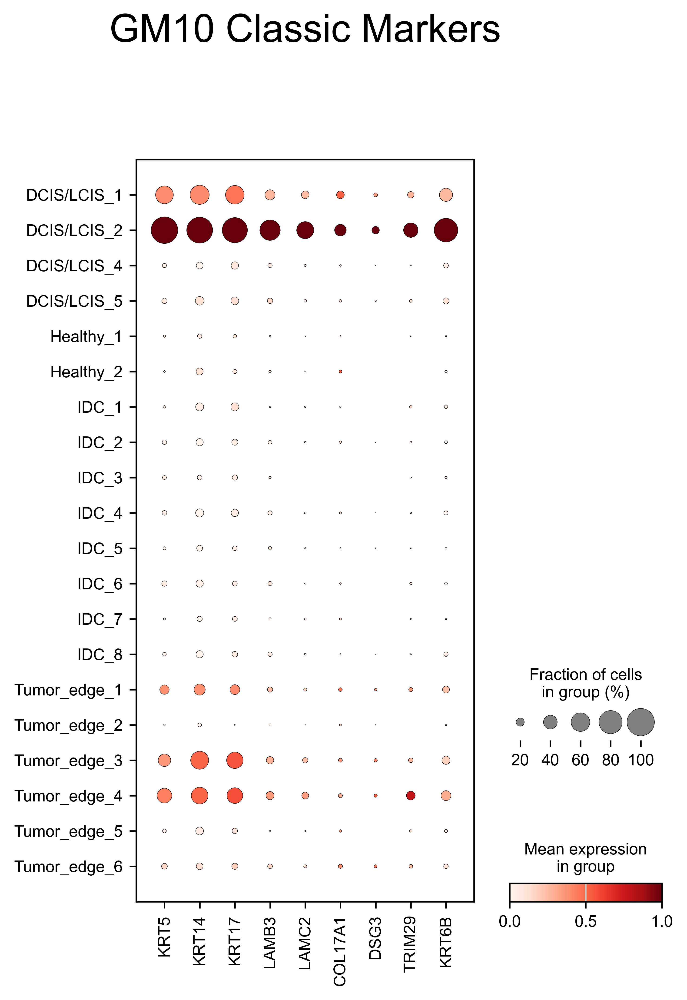

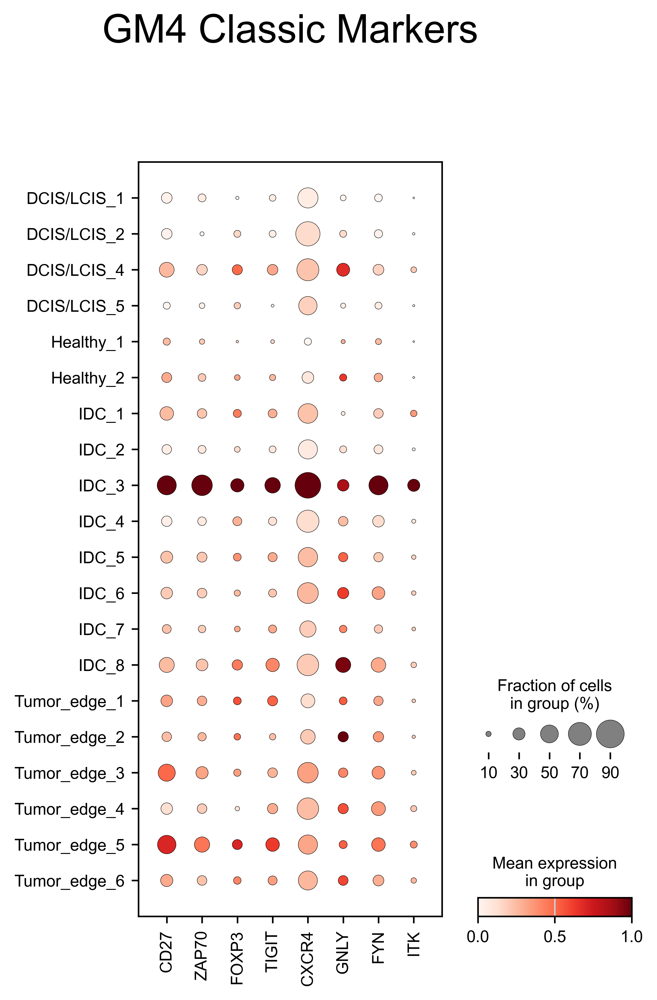

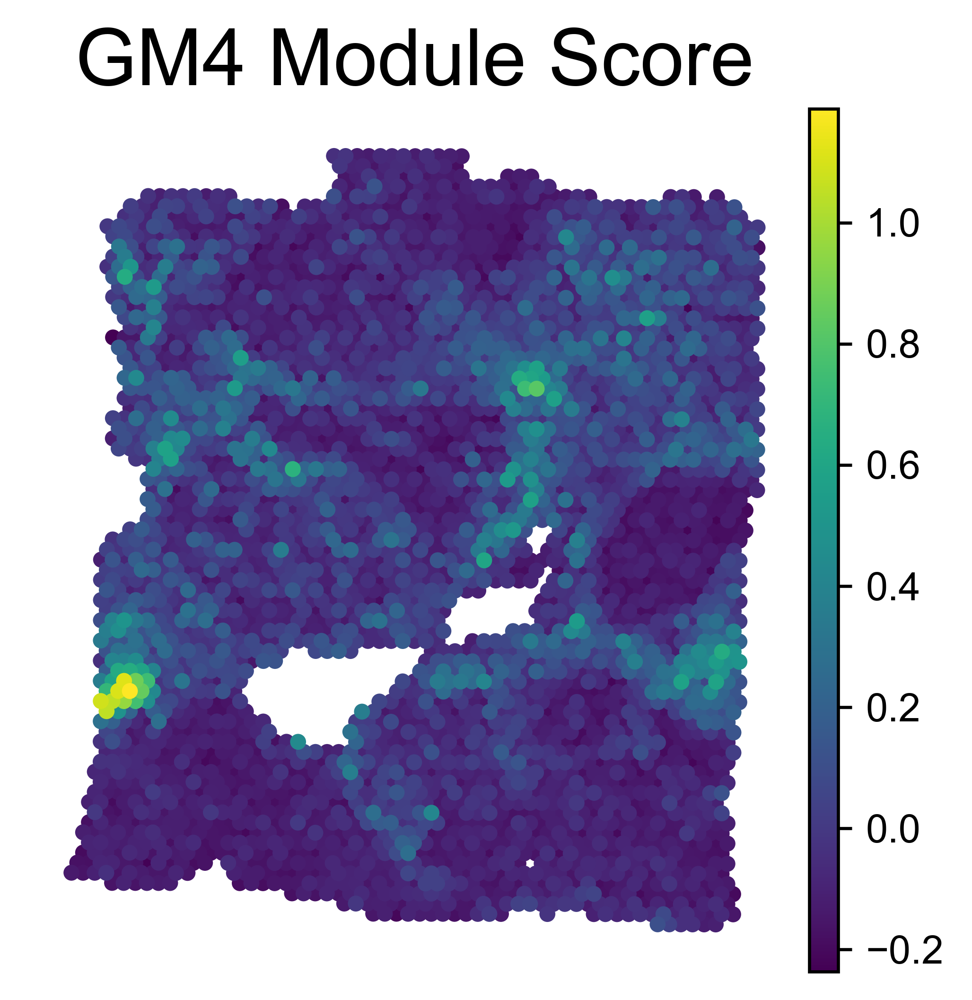

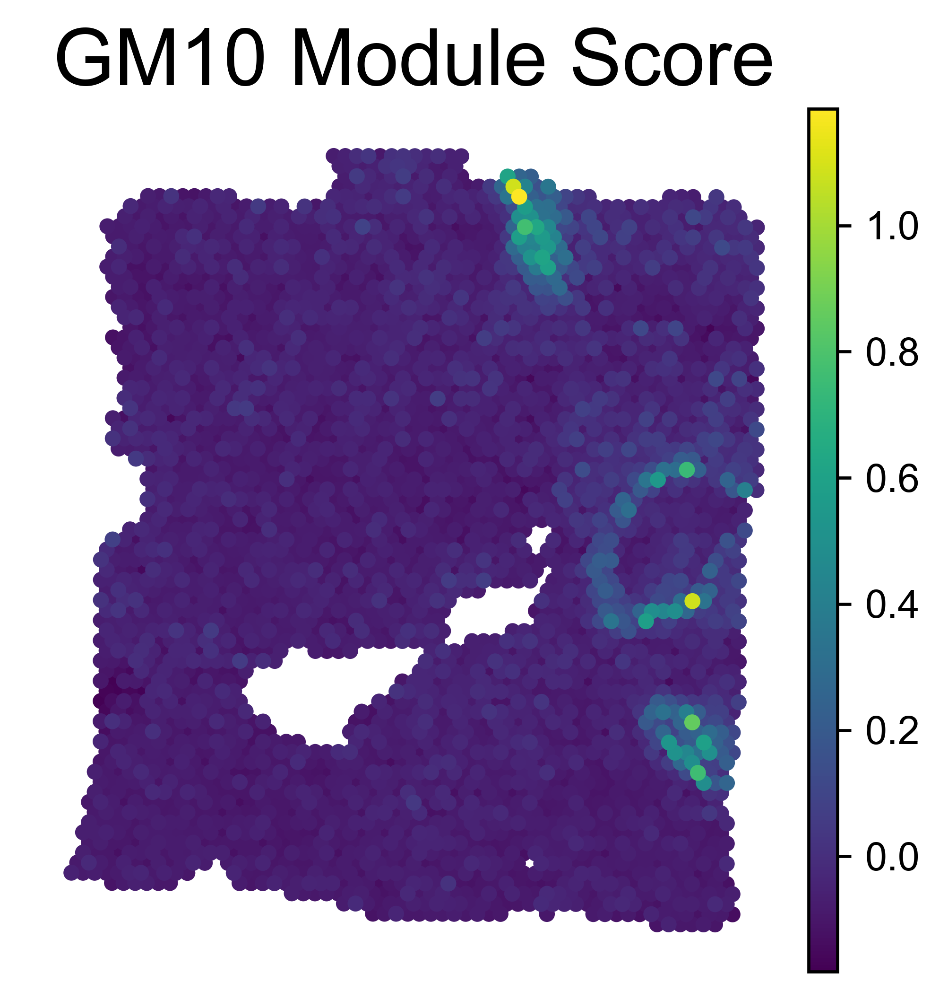

{4: ['CD27',
  'DENND1C',
  'CARMIL2',
  'GNLY',
  'TRAF3IP3',
  'IKZF3',
  'AKNA',
  'SELL',
  'CARD11',
  'PLEK',
  'CXCR4',
  'TCF7',
  'FOXP3',
  'FYN',
  'ITK',
  'LGALS2',
  'TIGIT',
  'IL21R',
  'PTPN7',
  'MNDA',
  'RHOF',
  'SASH3',
  'ETS1',
  'PIK3CD',
  'TMC8',
  'CD96',
  'BIRC3',
  'SLAMF7',
  'CLEC10A',
  'ARHGAP45',
  'CPVL',
  'KLRG1',
  'JAK3',
  'ZAP70',
  'ZNF683',
  'RAC2',
  'ARHGAP9',
  'IL16',
  'NCF1',
  'CD40'],
 10: ['GABRP',
  'DSG3',
  'KRT16',
  'TRIM29',
  'KLK7',
  'DSC3',
  'S100A2',
  'LAMB3',
  'KRT6B',
  'LGALS7',
  'MIA',
  'MMP10',
  'KRT14',
  'KRT77',
  'CALML3',
  'C5orf46',
  'KRT17',
  'PROM1',
  'MMP7',
  'KRTDAP',
  'SERPINB5',
  'SOSTDC1',
  'KLK10',
  'KRT5',
  'COL17A1',
  'KLK5',
  'KLK8',
  'KRT81',
  'LAMC2',
  'ANXA8L1',
  'IGFL3',
  'BBOX1',
  'KRT6A',
  'SLPI',
  'PDLIM4',
  'KRT15',
  'BHLHE41',
  'SYT8',
  'LY6D',
  'KRT23']}

In [ ]:

def fig8F_enrichment(
    module_to_genes,
    outdir="./Fig8",
    organism="Human",
    top_terms=12,
):
    os.makedirs(outdir, exist_ok=True)
    all_rows = []
    libraries = [
        "MSigDB_Hallmark_2020",
        "GO_Biological_Process_2021",
        "KEGG_2021_Human",
    ]

    for m, glist in module_to_genes.items():
        glist = list(dict.fromkeys(glist))
        if len(glist) < 10:
            continue

        for lib in libraries:
            enr = gp.enrichr(
                gene_list=glist,
                gene_sets=lib,
                organism=organism,
                outdir=None,
                cutoff=0.5,
                no_plot=True,
            )
            if enr is None or enr.results is None or enr.results.shape[0] == 0:
                continue

            res = enr.results.copy()
            res["module"] = f"GM{m}"
            res["library"] = lib
            all_rows.append(res)

            r = res.sort_values("Adjusted P-value").head(top_terms).copy()
            r["-log10(FDR)"] = -np.log10(r["Adjusted P-value"] + 1e-300)

            plt.figure(figsize=(7, 3.8))
            plt.barh(r["Term"][::-1], r["-log10(FDR)"][::-1])
            plt.xlabel("-log10(FDR)")
            plt.title(f"{lib} enrichment: GM{m}")
            plt.tight_layout()
            plt.savefig(os.path.join(outdir, f"Fig8F_enrich_{lib}_GM{m}.pdf"), dpi=300, bbox_inches="tight")
            plt.grid(None)
            plt.show()
            plt.close()

    if len(all_rows) > 0:
        df_all = pd.concat(all_rows, axis=0, ignore_index=True)
        df_all.to_csv(os.path.join(outdir, "Fig8F_enrichment_all.csv"), index=False)
        return df_all
    return None

def load_gene_embedding(model_name, emb_dir=None):
    if emb_dir is None:
        emb_dir = "./STCOGAT/Embedding"

    gene_path = os.path.join(emb_dir, f"row_embedding_{model_name}.pkl")
    if not os.path.exists(gene_path):
        gene_path = os.path.join(emb_dir, f"row_embedding_{model_name}")
    
    if not os.path.exists(gene_path):
        raise FileNotFoundError(f"Embedding file not found: {gene_path}")
        
    gene_embed = pd.read_pickle(gene_path)
    gene_embed = np.asarray(gene_embed)

    genes_path = os.path.join(emb_dir, f"genes_{model_name}.txt")
    if os.path.exists(genes_path):
        genes = np.array([x.strip() for x in open(genes_path)])
    else:
        genes = None

    return genes, gene_embed


def cluster_gene_modules(gene_embed, resolution=0.8, n_neighbors=15, key_added="gene_module"):
    adg = sc.AnnData(gene_embed)
    sc.pp.neighbors(adg, n_neighbors=n_neighbors, use_rep="X")
    sc.tl.leiden(adg, resolution=resolution, key_added=key_added)
    modules = adg.obs[key_added].astype(int).values
    return modules

def pick_top_genes_in_module(genes, gene_embed, modules, module_id, topn=30):
    idx = np.where(modules == int(module_id))[0]
    if idx.size == 0:
        return []
    X = gene_embed[idx]
    center = X.mean(axis=0, keepdims=True)
    dist = ((X - center) ** 2).sum(axis=1)
    order = idx[np.argsort(dist)]
    top_genes = genes[order[:min(topn, order.size)]].tolist()
    return top_genes

def fig8E_validate_modules_raw(
    adata_raw,
    genes,
    module_to_genes,      
    module_to_show=None,  
    gt_key="ground_truth",
    outdir="./Fig8",
):
    os.makedirs(outdir, exist_ok=True)
    
    if module_to_show is None:
        module_to_show = {m: g[:10] for m, g in module_to_genes.items()}

    for m, show_list in module_to_show.items():
        valid_show = [g for g in show_list if g in adata_raw.var_names]
        if len(valid_show) == 0:
            continue
            
        sc.pl.dotplot(
            adata_raw,
            var_names=valid_show,
            groupby=gt_key,
            standard_scale="var",
            title=f"GM{m} Classic Markers",
            
            show=False,
        )
        plt.savefig(os.path.join(outdir, f"Fig8E_dotplot_GM{m}_classic.pdf"), dpi=300, bbox_inches="tight")
        plt.show()
        plt.close()

        genes_to_plot = valid_show[:9]
        if len(genes_to_plot) > 0:
            sc.pl.spatial(
                adata_raw,
                color=genes_to_plot,
                size=1.5,
                spot_size=250, 
                img_key=None,
                ncols=3,
                title=[f"GM{m}: {g}" for g in genes_to_plot],
                show=False,
            )
            plt.savefig(os.path.join(outdir, f"Fig8E_spatial_markers_GM{m}.pdf"), dpi=300, bbox_inches="tight")
            plt.close()

    for m, full_list in module_to_genes.items():
        if len(full_list) < 5:
            continue
        
        score_key = f"GM{m}_score"
        valid_full = [g for g in full_list if g in adata_raw.var_names]
        
        sc.tl.score_genes(adata_raw, gene_list=valid_full, score_name=score_key, use_raw=False)

        sc.pl.spatial(
            adata_raw,
            color=[score_key],
            size=1.5,
            spot_size=250, 
            img_key=None,
            frameon=False,
            title=f"GM{m} Module Score",
            show=False,
        )
        plt.savefig(os.path.join(outdir, f"Fig8E_spatial_score_GM{m}.pdf"), dpi=300, bbox_inches="tight")
        plt.show()
        plt.close()

def make_Fig8E_F(
    adata_raw,
    model_name,
    module_pick=(4, 10),
    module_show_dict=None, 
    module_resolution=0.8,
    module_k=15,
    top_genes_per_module=40,
    gt_key="ground_truth",
    outdir="./Fig8",
    emb_dir=None,
):
    genes, gene_embed = load_gene_embedding(model_name, emb_dir=emb_dir)
    if genes is None:
        G = gene_embed.shape[0]
        genes = np.array(adata_raw.var_names[:G])

    modules = cluster_gene_modules(gene_embed, resolution=module_resolution, n_neighbors=module_k)

    module_to_genes_full = {}
    for m in module_pick:
        module_to_genes_full[int(m)] = pick_top_genes_in_module(
            genes=genes, gene_embed=gene_embed, modules=modules, module_id=int(m), topn=top_genes_per_module
        )

    mod_tbl = []
    for m, glist in module_to_genes_full.items():
        for rank, g in enumerate(glist, start=1):
            mod_tbl.append({"module": f"GM{m}", "rank": rank, "gene": g})

    fig8E_validate_modules_raw(
        adata_raw=adata_raw,
        genes=genes,
        module_to_genes=module_to_genes_full, 
        module_to_show=module_show_dict,       
        gt_key=gt_key,
        outdir=outdir,
    )

    enr_all = fig8F_enrichment(module_to_genes_full, outdir=outdir, organism="Human", top_terms=12)

    mod_tbl = []
    for m, glist in module_to_genes_full.items():
        for rank, g in enumerate(glist, start=1):
            mod_tbl.append({"module": f"GM{m}", "rank": rank, "gene": g})
    pd.DataFrame(mod_tbl).to_csv(os.path.join(outdir, "Fig8E_modules_topgenes.csv"), index=False)

    return module_to_genes_full


custom_markers = {
    10: [
        "KRT5", "KRT14", "KRT17",   
        "LAMB3", "LAMC2",           
        "COL17A1", "DSG3",         
        "TRIM29", "KRT6B"           
    ],
    
    4: [
        "CD27", "ZAP70",            
        "FOXP3", "TIGIT",           
        "CXCR4",                    
        "GNLY",                    
        "FYN", "ITK"                
    ]
}


make_Fig8E_F(
    adata_raw=raw,              
    model_name="BRCA1_gene",    
    module_pick=(4, 10),       
    module_show_dict=custom_markers, 
    module_resolution=0.5,
    top_genes_per_module=40,    
    gt_key="ground_truth",     
    outdir=outdir,
    emb_dir="./STCOGAT/Embedding"
)

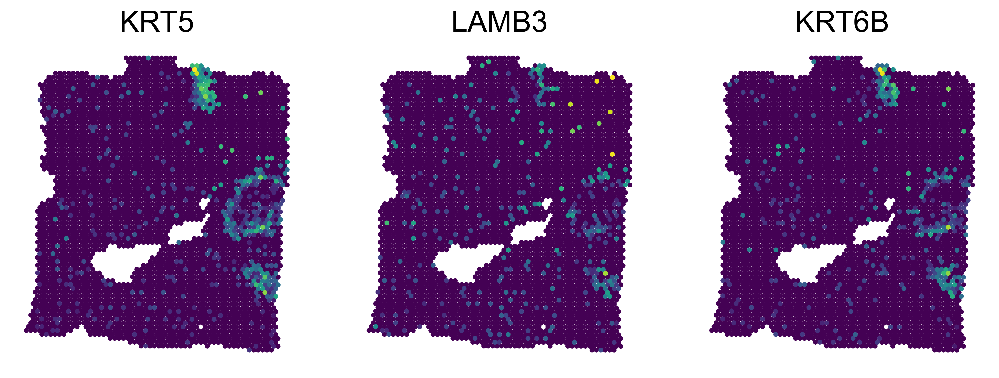

In [ ]:
plt.rcParams.update({'axes.titlesize': 20})
svgs_list1=["KRT5","LAMB3","KRT6B"]
sc.pl.spatial(raw, color=svgs_list1, size=1.5,ncols=8,spot_size=200,colorbar_loc=None,wspace=0.01,frameon=False,img_key=None,save='gene_raw.pdf')

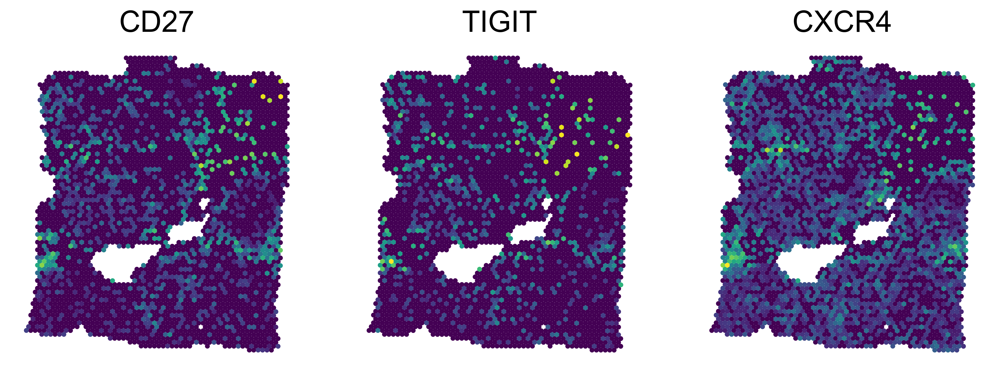

In [80]:
svgs_list2=["CD27","TIGIT","CXCR4",]
sc.pl.spatial(raw, color=svgs_list2, size=1.5,ncols=8,spot_size=200,colorbar_loc=None,wspace=0.01,frameon=False,img_key=None,save='gene_raw.pdf')